In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt



import tensorflow as tf
from keras.layers import (Dense,Conv1D,BatchNormalization,GlobalAveragePooling1D
                          ,MaxPooling1D,AveragePooling1D,Multiply,Add)


from tensorflow.keras.models import model_from_json
from define_CNN_class import MyResNetModel
from define_CNN_class import ResidualBlock
from define_CNN_class import NoiseGate


In [68]:
custom_objects={
        'MyResNetModel': MyResNetModel,
        'ResidualBlock':ResidualBlock,
        'NoiseGate':NoiseGate        
        }

with open(r'cnn_model_structual_data.json', 'r') as json_file:

    json_string = json_file.read()
    model = model_from_json(json_string,custom_objects=custom_objects)


model.load_weights(r"cnn_model.weights.h5")
model.summary()
model.compile(optimizer='adam', loss='mse')



c:\プログラミング\python_env\Lib\site-packages\keras\src\saving\serialization_lib.py:730: UserWarning: Model 'my_res_net_model_5' had a build config, but the model cannot be built automatically in `build_from_config(config)`. You should implement `def build_from_config(self, config)`, and you might also want to implement the method  that generates the config at saving time, `def get_build_config(self)`. The method `build_from_config()` is meant to create the state of the model (i.e. its variables) upon deserialization.
  instance.build_from_config(build_config)


Model: "my_res_net_model_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ average_pooling1d_5             │ (None, 155, 32)        │             0 │
│ (AveragePooling1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 77, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_20               │ ?                      │        17,344 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_21               │ ?                      │        81,344 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_22               │ ?                      │       322,432 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_23               │ ?                      │     1,283,840 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_29     │ (None, 256)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 100)            │        25,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 200)            │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 310)            │        62,310 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ noise_gate_5 (NoiseGate)        │ ?                      │        13,313 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,471,771 (20.87 MB)

 Trainable params: 1,822,643 (6.95 MB)

 Non-trainable params: 3,840 (15.00 KB)

 Optimizer params: 3,645,288 (13.91 MB)

In [58]:
df1= pd.read_excel(r"PKSP_Q84mse(25,40,55)v2.xlsx",sheet_name="解析用平均値",header=1)
df1_X=df1[df1['Temp'] == 298]
df1_X=df1_X[df1['サンプルNo.'] >=17]
times=df1_X.columns[10:320]

NMR_data=df1_X.copy().loc[:,times]
nom_NMR_data=(NMR_data-np.min(NMR_data))/(np.max(NMR_data)-np.min(NMR_data))

CNN_smooth=pd.DataFrame()
CNN_gap=pd.DataFrame()

for i in range(len(NMR_data)):
    pred=model.predict(np.array(NMR_data.iloc[i,:]).reshape(1,310,1))
                       
    data,gap=pred[0].reshape(-1),pred[1].reshape(-1)#出力を取得
    CNN_smooth[f"Q{i+17}-MSE-298-1"]=data
    CNN_gap[f"Q{i+17}-MSE-298-1"]=gap

CNN_smooth=CNN_smooth.T
CNN_gap=CNN_gap.T




C:\Users\ryo00\AppData\Local\Temp\ipykernel_38692\2091008411.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df1_X=df1_X[df1['サンプルNo.'] >=17]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━

結晶化温度(ノイズ除去前)

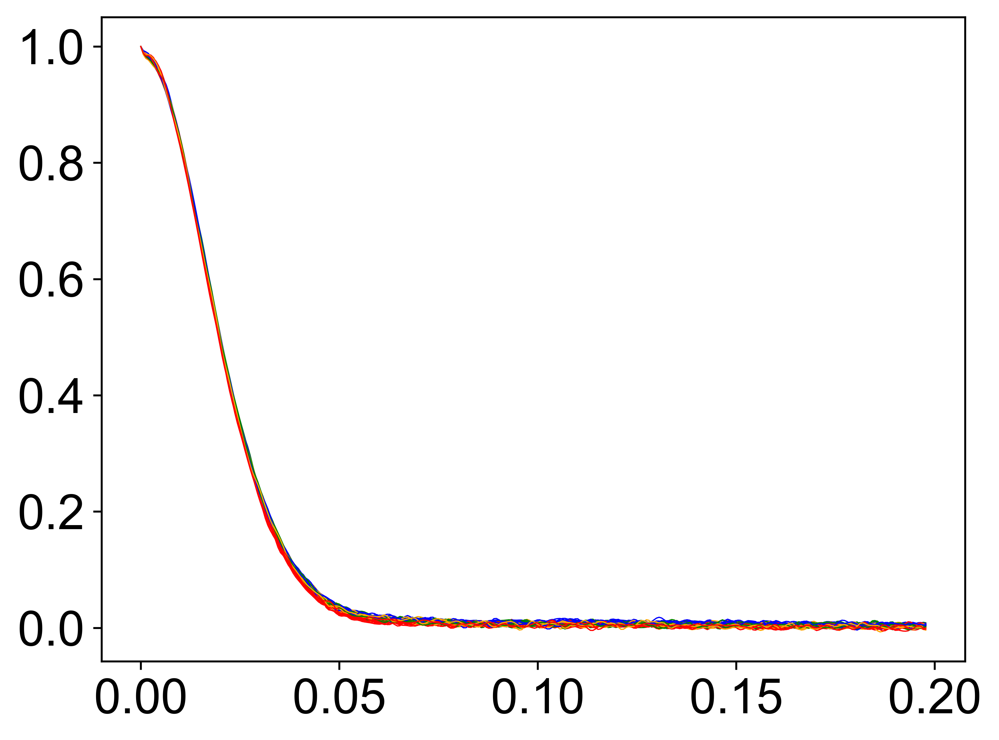

c:\プログラミング\python_env\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


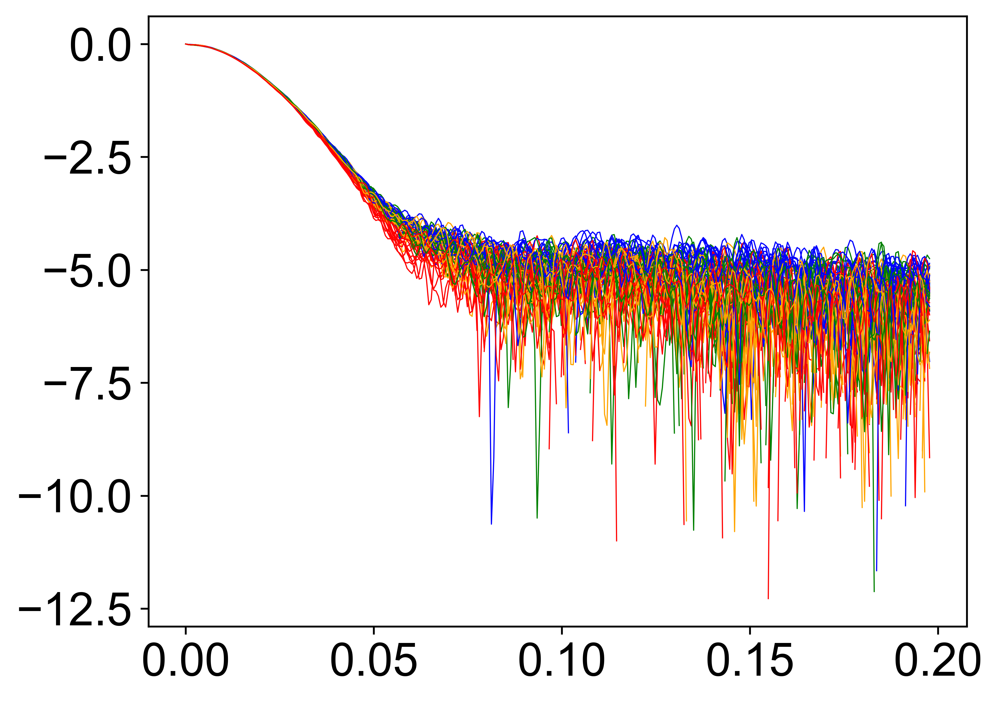

In [59]:
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.figure(dpi=600)
for i in range(16):
    
    
    plt.plot(times,(NMR_data.iloc[0*16+i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,(NMR_data.iloc[1*16+i,:]),c="green",label="90",lw=0.5)
    plt.plot(times,(NMR_data.iloc[2*16+i,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,(NMR_data.iloc[3*16+i,:]),c="red",label="120",lw=0.5)

plt.show()

plt.figure(dpi=600)
for i in range(16):
    plt.plot(times,np.log(NMR_data.iloc[0*16+i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,np.log(NMR_data.iloc[1*16+i,:]),c="green",label="90",lw=0.5)
    plt.plot(times,np.log(NMR_data.iloc[2*16+i,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,np.log(NMR_data.iloc[3*16+i,:]),c="red",label="120",lw=0.5)
plt.show()


結晶化温度(ノイズ除去後)

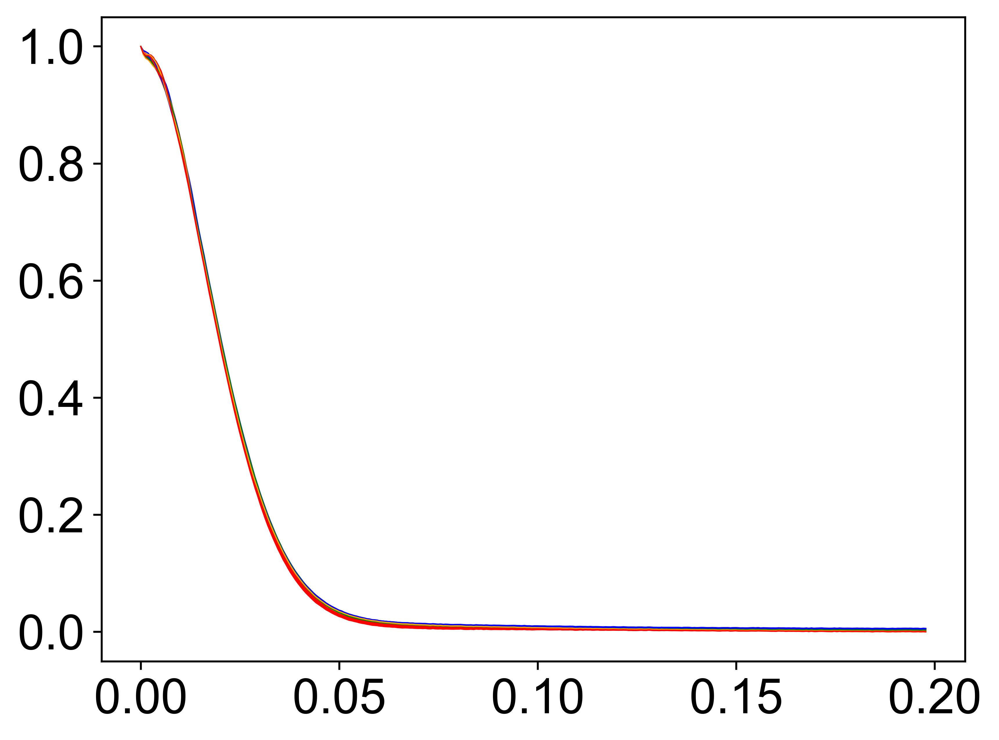

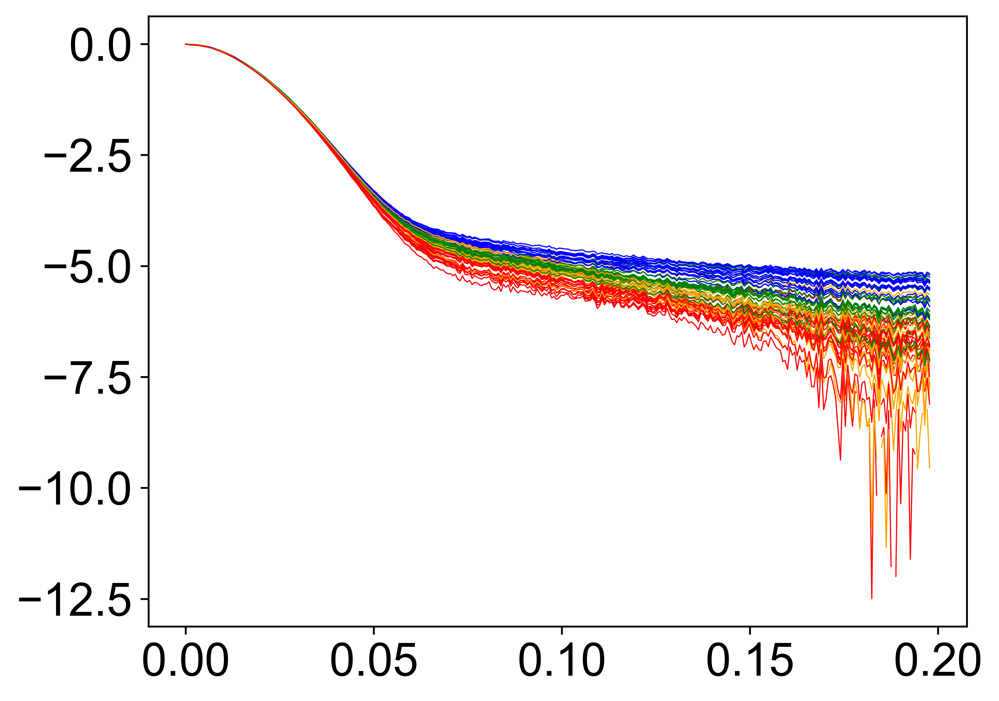

In [60]:
plt.figure(dpi=600)

#結晶化温度別
for i in range(16):
    plt.plot(times,(CNN_smooth.iloc[0*16+i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,(CNN_smooth.iloc[1*16+i,:]),c="green",label="90",lw=0.5)
    plt.plot(times,(CNN_smooth.iloc[2*16+i,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,(CNN_smooth.iloc[3*16+i,:]),c="red",label="120",lw=0.5)
    
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20

plt.show()

plt.figure(dpi=600)

#結晶化温度別
for i in range(16):
    plt.plot(times,np.log(CNN_smooth.iloc[0*16+i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,np.log(CNN_smooth.iloc[1*16+i,:]),c="green",label="90",lw=0.5)
    plt.plot(times,np.log(CNN_smooth.iloc[2*16+i,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,np.log(CNN_smooth.iloc[3*16+i,:]),c="red",label="120",lw=0.5)
    #print(0*16+i)
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20

plt.show()

核剤濃度(ノイズ除去前)

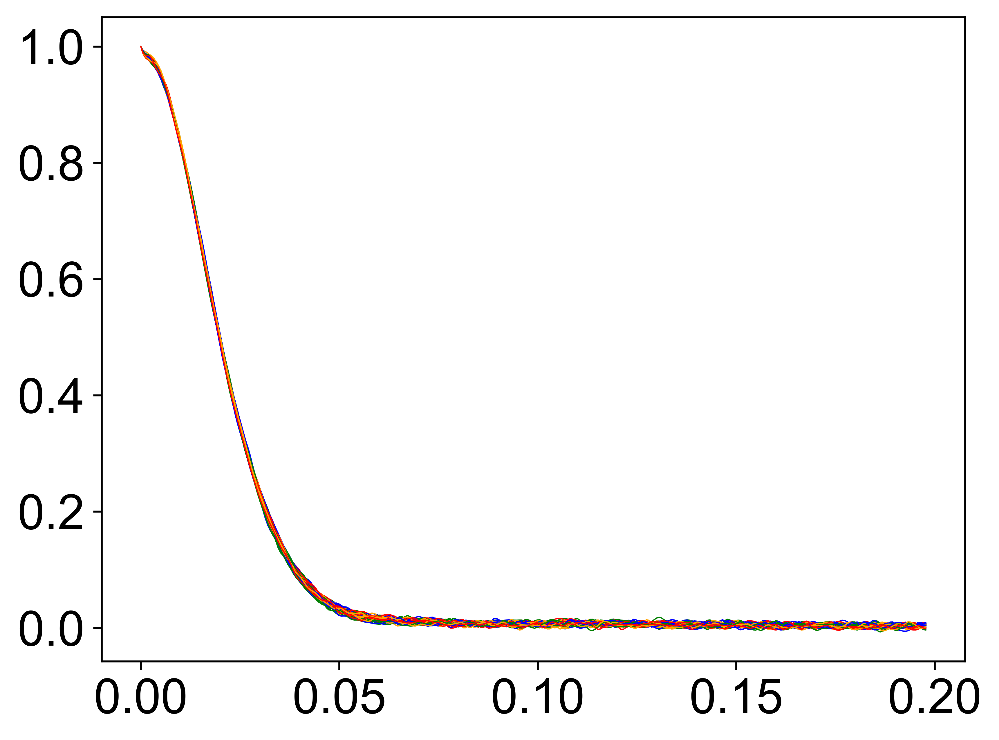

c:\プログラミング\python_env\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


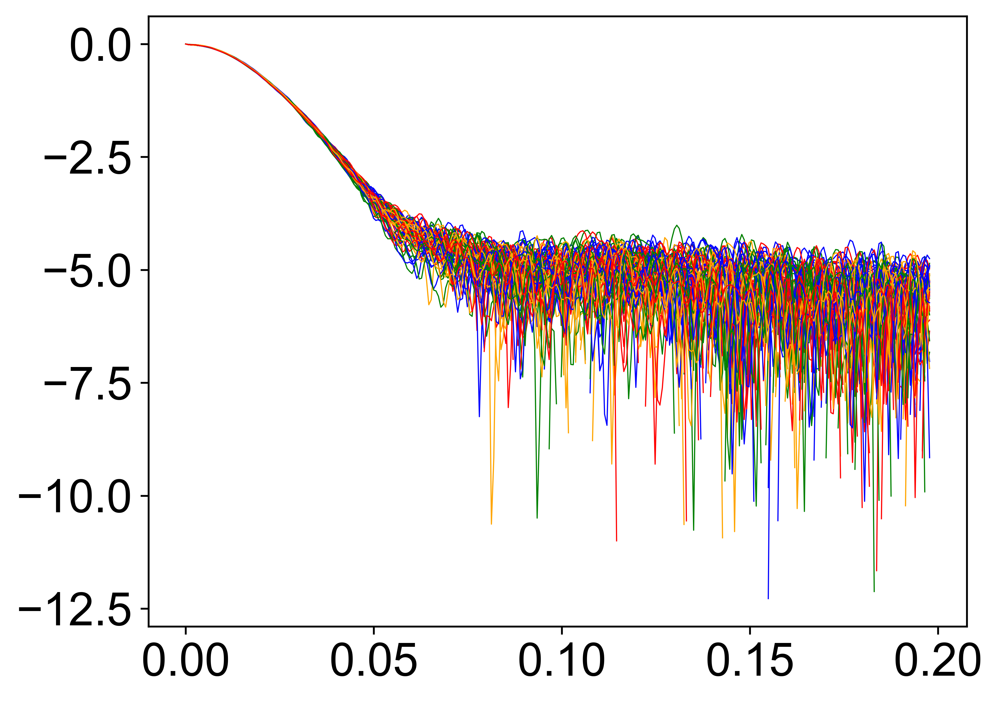

In [66]:
plt.figure(dpi=600)
for i in range(16):
    plt.plot(times,(NMR_data.iloc[4*i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,(NMR_data.iloc[4*i+1,:]),c="green",label="90",lw=0.5)
    plt.plot(times,(NMR_data.iloc[4*i+2,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,(NMR_data.iloc[4*i+3,:]),c="red",label="120",lw=0.5)

plt.show()

plt.figure(dpi=600)
for i in range(16):
    plt.plot(times,np.log(NMR_data.iloc[4*i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,np.log(NMR_data.iloc[4*i+1,:]),c="green",label="90",lw=0.5)
    plt.plot(times,np.log(NMR_data.iloc[4*i+2,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,np.log(NMR_data.iloc[4*i+3,:]),c="red",label="120",lw=0.5)
plt.show()


核剤濃度(ノイズ除去後)

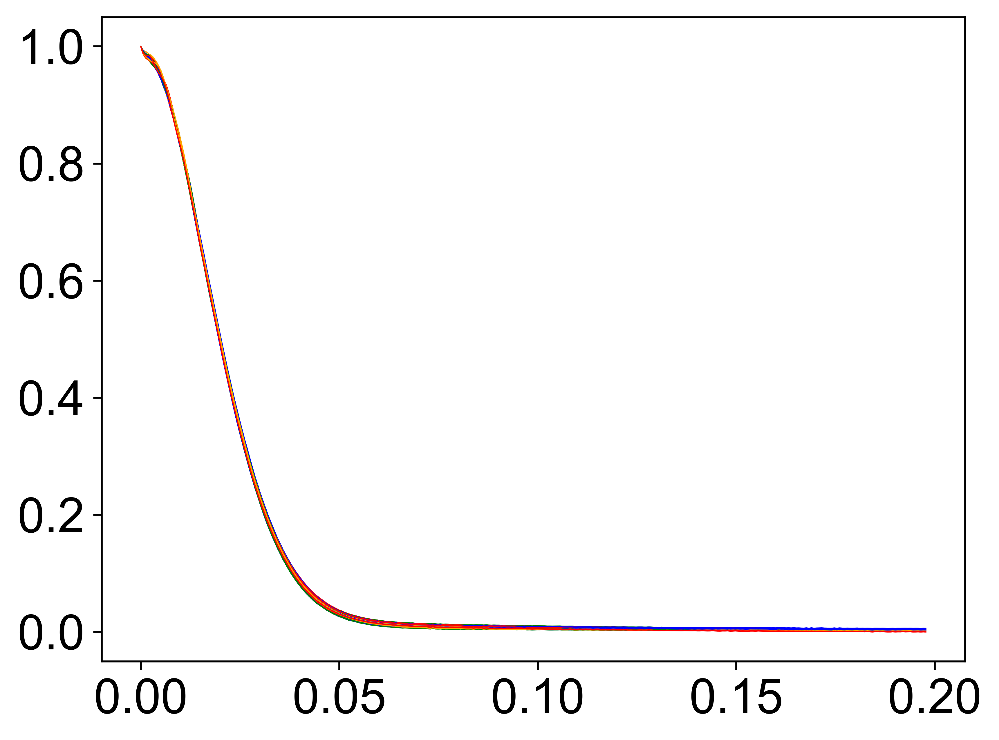

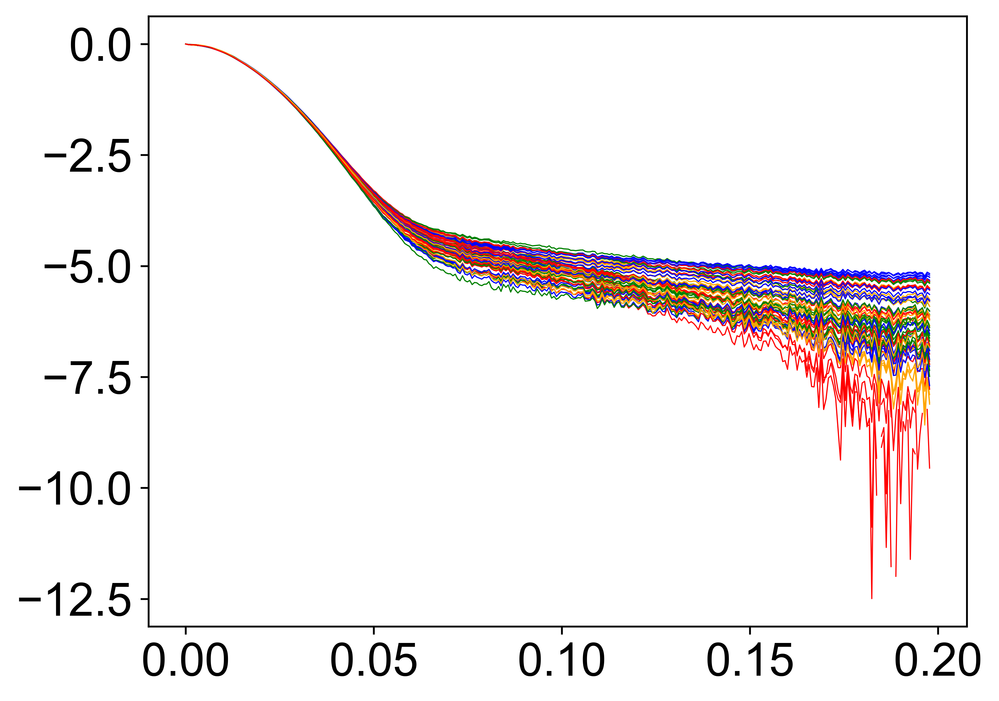

In [62]:
plt.figure(dpi=600)

for i in range(16):
    plt.plot(times,(CNN_smooth.iloc[4*i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,(CNN_smooth.iloc[4*i+1,:]),c="green",label="90",lw=0.5)
    plt.plot(times,(CNN_smooth.iloc[4*i+2,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,(CNN_smooth.iloc[4*i+3,:]),c="red",label="120",lw=0.5)

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20



plt.show()


plt.figure(dpi=600)

#核剤濃度
for i in range(16):
    plt.plot(times,np.log(CNN_smooth.iloc[4*i,:]),c="blue",label="75",lw=0.5)
    plt.plot(times,np.log(CNN_smooth.iloc[4*i+1,:]),c="green",label="90",lw=0.5)
    plt.plot(times,np.log(CNN_smooth.iloc[4*i+2,:]),c="orange",label="105",lw=0.5)
    plt.plot(times,np.log(CNN_smooth.iloc[4*i+3,:]),c="red",label="120",lw=0.5)
    #print(4*i)

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20

#plt.figure(figsize=[100,100])

plt.show()

結晶化時間(ノイズ除去前)

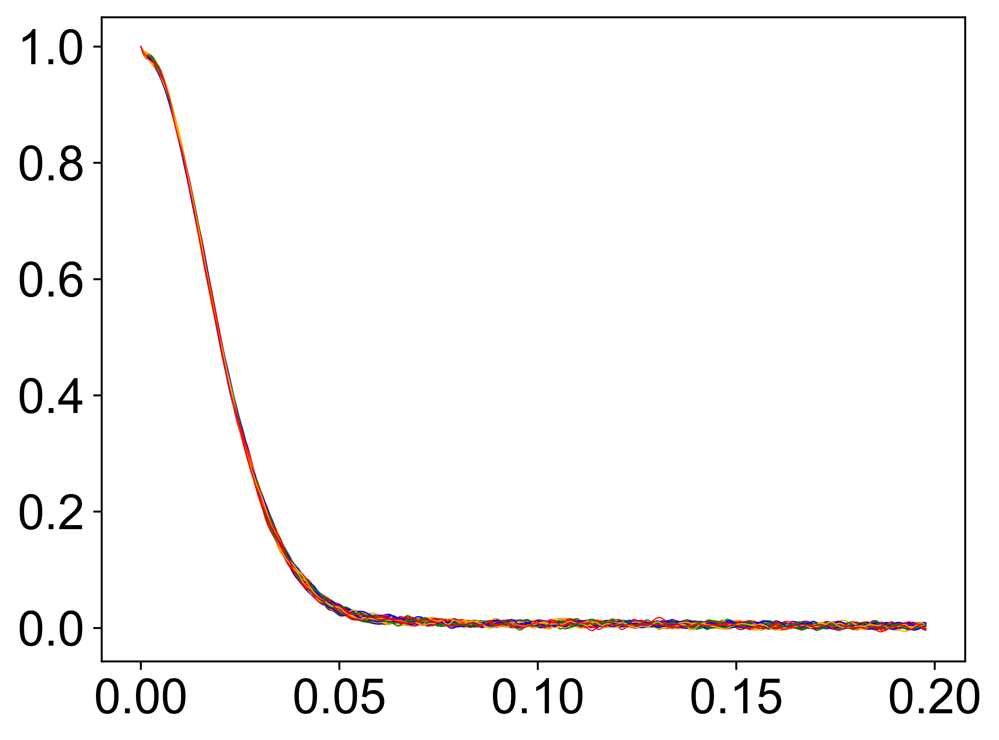

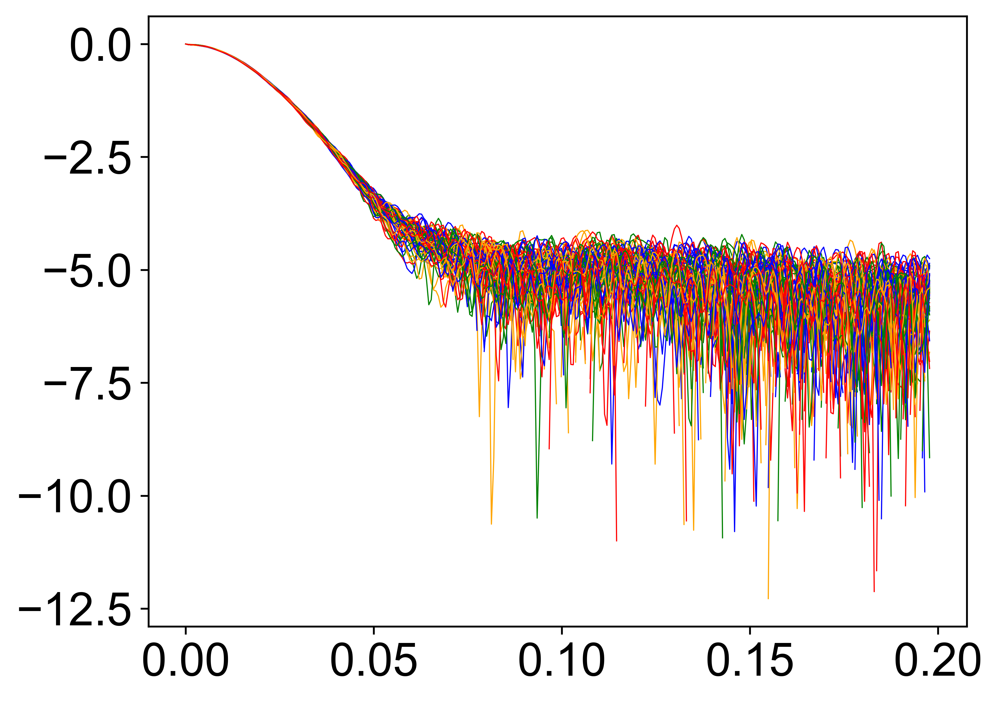

In [63]:
plt.figure(dpi=600)
for i in range(4):
    for j in range(4):
        plt.plot(times,(NMR_data.iloc[4*4*i+j,:]),c="blue",label="75",lw=0.5)
        plt.plot(times,(NMR_data.iloc[4*4*i+4+j,:]),c="green",label="90",lw=0.5)
        plt.plot(times,(NMR_data.iloc[4*4*i+8+j,:]),c="orange",label="105",lw=0.5)
        plt.plot(times,(NMR_data.iloc[4*4*i+12+j,:]),c="red",label="120",lw=0.5)
        #print(4*4*i+j)
plt.show()

plt.figure(dpi=600)
for i in range(4):
    for j in range(4):
        plt.plot(times,np.log(NMR_data.iloc[4*4*i+j,:]),c="blue",label="75",lw=0.5)
        plt.plot(times,np.log(NMR_data.iloc[4*4*i+4+j,:]),c="green",label="90",lw=0.5)
        plt.plot(times,np.log(NMR_data.iloc[4*4*i+8+j,:]),c="orange",label="105",lw=0.5)
        plt.plot(times,np.log(NMR_data.iloc[4*4*i+12+j,:]),c="red",label="120",lw=0.5)
        #print(4*4*i+j)
plt.show()

結晶化時間(ノイズ除去後)

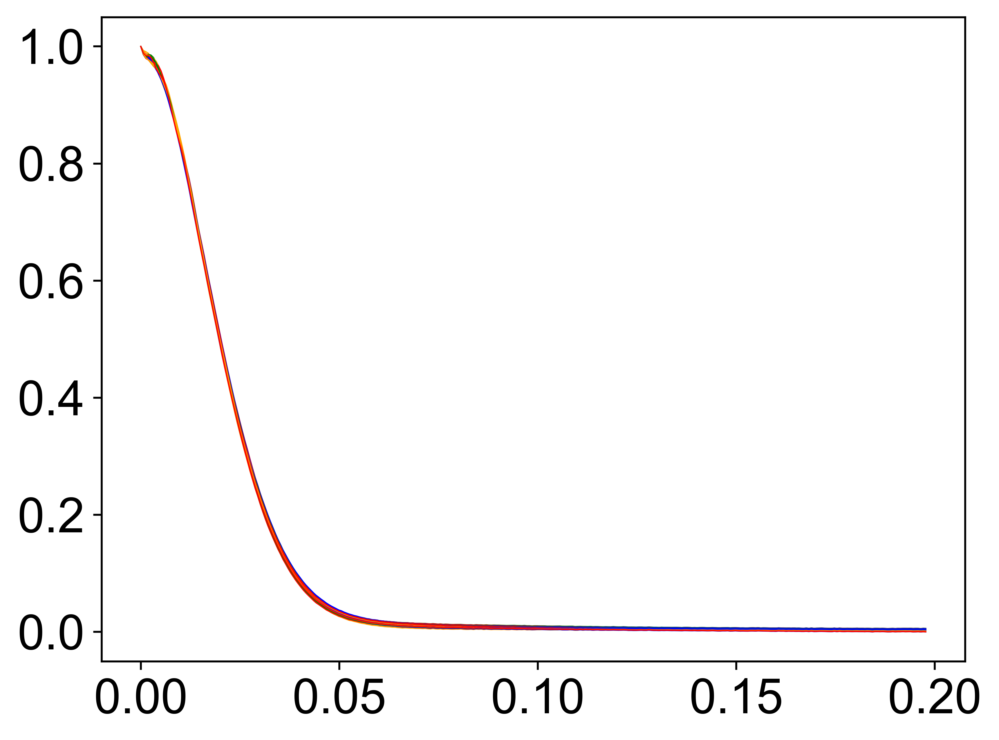

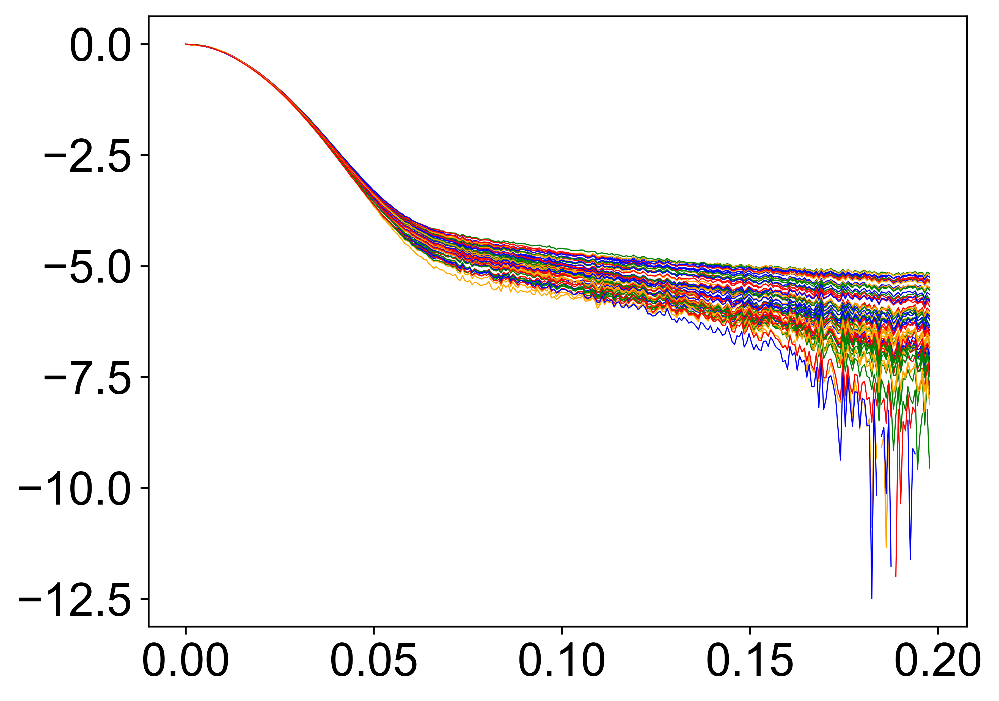

In [64]:
plt.figure(dpi=600)

#結晶化時間
for i in range(4):
    for j in range(4):
        plt.plot(times,(CNN_smooth.iloc[4*4*i+j,:]),c="blue",label="75",lw=0.5)
        plt.plot(times,(CNN_smooth.iloc[4*4*i+4+j,:]),c="green",label="90",lw=0.5)
        plt.plot(times,(CNN_smooth.iloc[4*4*i+8+j,:]),c="orange",label="105",lw=0.5)
        plt.plot(times,(CNN_smooth.iloc[4*4*i+12+j,:]),c="red",label="120",lw=0.5)
        #print(4*4*i+j)
plt.show()
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20



plt.show()


plt.figure(dpi=600)

#結晶化時間
for i in range(4):
    for j in range(4):
        plt.plot(times,np.log(CNN_smooth.iloc[4*4*i+j,:]),c="blue",label="75",lw=0.5)
        plt.plot(times,np.log(CNN_smooth.iloc[4*4*i+4+j,:]),c="green",label="90",lw=0.5)
        plt.plot(times,np.log(CNN_smooth.iloc[4*4*i+8+j,:]),c="orange",label="105",lw=0.5)
        plt.plot(times,np.log(CNN_smooth.iloc[4*4*i+12+j,:]),c="red",label="120",lw=0.5)
        #print(4*4*i+j)
plt.show()

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20


plt.show()

Supliment_figure S1

48     17.0
51     18.0
54     19.0
57     20.0
60     21.0
       ... 
237    80.0
240    81.0
243    82.0
246    83.0
249    84.0
Name: サンプルNo., Length: 68, dtype: float64
                    0         1         2         3         4         5    \
Q17-MSE-298-1  0.999694  0.988802  0.983061  0.979468  0.973776  0.967034   
Q18-MSE-298-1  0.999698  0.988294  0.982524  0.980814  0.977978  0.972379   
Q19-MSE-298-1  0.999715  0.989969  0.985591  0.983205  0.978771  0.973309   
Q20-MSE-298-1  0.999704  0.987804  0.982974  0.982034  0.979111  0.973633   
Q21-MSE-298-1  0.999700  0.988067  0.982619  0.980876  0.977878  0.973097   
...                 ...       ...       ...       ...       ...       ...   
Q80-MSE-298-1  0.999705  0.988269  0.983971  0.984174  0.981088  0.972844   
Q81-MSE-298-1  0.999688  0.987841  0.981096  0.978501  0.975357  0.970061   
Q82-MSE-298-1  0.999724  0.990230  0.986982  0.985254  0.980218  0.974013   
Q83-MSE-298-1  0.999696  0.988582  0.983064  0.980053  0

C:\Users\ryo00\AppData\Local\Temp\ipykernel_38692\2287339574.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df1_X=df1_X[df1['サンプルNo.'] >=17]


<Figure size 3840x2880 with 0 Axes>

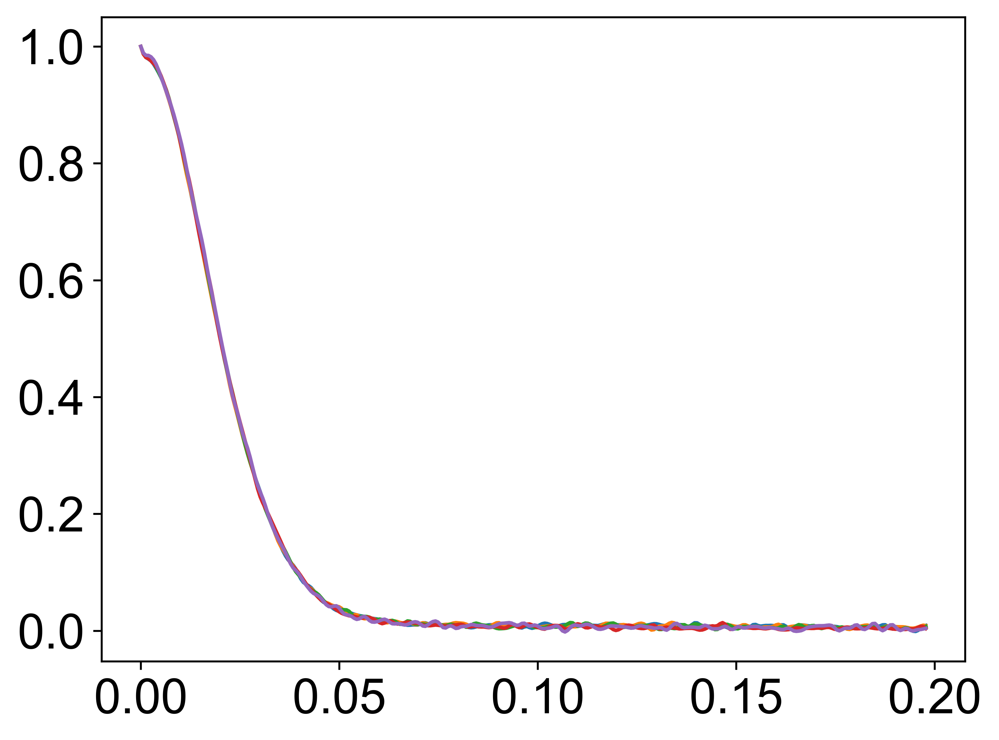

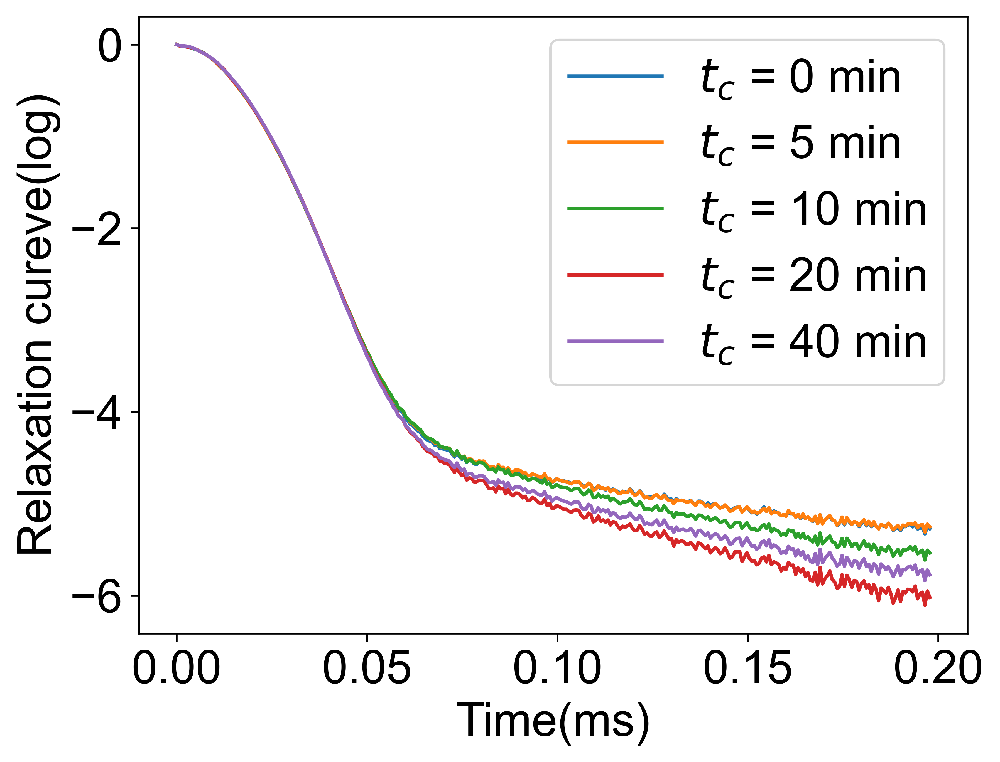

In [67]:
plt.figure(dpi=600)
df1= pd.read_excel(r"PKSP_Q84mse(25,40,55)v2.xlsx",sheet_name="解析用平均値",header=1)
df1_X=df1[df1['Temp'] == 298]
df1_X=df1_X[df1['サンプルNo.'] >=17]

times=df1_X.columns[10:320]

print(df1_X['サンプルNo.'] )
#print(df1_X[df1_X['サンプルNo.'] ==17][times])
#print(CNN_smooth.shape)
print(CNN_smooth)


plt.figure(dpi=600)

plt.plot(times,np.array(df1_X[df1_X['サンプルNo.'] ==81].loc[:,times]).reshape(-1))
plt.plot(times,np.array(df1_X[df1_X['サンプルNo.'] ==33].loc[:,times]).reshape(-1))
plt.plot(times,np.array(df1_X[df1_X['サンプルNo.'] ==37].loc[:,times]).reshape(-1))
plt.plot(times,np.array(df1_X[df1_X['サンプルNo.'] ==41].loc[:,times]).reshape(-1))
plt.plot(times,np.array(df1_X[df1_X['サンプルNo.'] ==45].loc[:,times]).reshape(-1))
plt.plot()

plt.figure(dpi=600)


plt.rcParams["font.family"]="Arial"
plt.rcParams["font.size"]=20
plt.plot(times,np.log(CNN_smooth.loc[f"Q{81}-MSE-298-1",:]), label=r"$t_c$ = 0 min")
plt.plot(times,np.log(CNN_smooth.loc[f"Q{33}-MSE-298-1",:]), label=r"$t_c$ = 5 min")
plt.plot(times,np.log(CNN_smooth.loc[f"Q{37}-MSE-298-1",:]), label=r"$t_c$ = 10 min")
plt.plot(times,np.log(CNN_smooth.loc[f"Q{41}-MSE-298-1",:]), label=r"$t_c$ = 20 min")
plt.plot(times,np.log(CNN_smooth.loc[f"Q{45}-MSE-298-1",:]), label=r"$t_c$ = 40 min")
plt.xlabel("Time(ms)")
plt.ylabel("Relaxation cureve(log)")
plt.legend()
plt.show()

#print(4*4*i+j)